<a href="https://colab.research.google.com/github/MATan1808/-n-t-p-SQL/blob/main/nhom13_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:

from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.metrics import classification_report
import numpy as np

#KNN
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report

#Decision Tree
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.tree import DecisionTreeClassifier,plot_tree, export_text
from sklearn import metrics

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split,cross_val_score
from sklearn import metrics

#RFC
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
import seaborn as sns

In [2]:
filepath='/content/Dry_Bean_Dataset.xlsx'

In [3]:
# Load data
data = pd.read_excel(filepath)

In [4]:
# Print the column names
print(data.columns)

Index(['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength',
       'AspectRation', 'Eccentricity', 'ConvexArea', 'EquivDiameter', 'Extent',
       'Solidity', 'roundness', 'Compactness', 'ShapeFactor1', 'ShapeFactor2',
       'ShapeFactor3', 'ShapeFactor4', 'Class'],
      dtype='object')


In [5]:
# Kiểm tra thông tin cơ bản về tập dữ liệu
info = data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   MinorAxisLength  13611 non-null  float64
 4   AspectRation     13611 non-null  float64
 5   Eccentricity     13611 non-null  float64
 6   ConvexArea       13611 non-null  int64  
 7   EquivDiameter    13611 non-null  float64
 8   Extent           13611 non-null  float64
 9   Solidity         13611 non-null  float64
 10  roundness        13611 non-null  float64
 11  Compactness      13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class            13611 non-null  object 
dtypes: float64(1

In [6]:
print(data.describe())

                Area     Perimeter  MajorAxisLength  MinorAxisLength  \
count   13611.000000  13611.000000     13611.000000     13611.000000   
mean    53048.284549    855.283459       320.141867       202.270714   
std     29324.095717    214.289696        85.694186        44.970091   
min     20420.000000    524.736000       183.601165       122.512653   
25%     36328.000000    703.523500       253.303633       175.848170   
50%     44652.000000    794.941000       296.883367       192.431733   
75%     61332.000000    977.213000       376.495012       217.031741   
max    254616.000000   1985.370000       738.860153       460.198497   

       AspectRation  Eccentricity     ConvexArea  EquivDiameter        Extent  \
count  13611.000000  13611.000000   13611.000000   13611.000000  13611.000000   
mean       1.583242      0.750895   53768.200206     253.064220      0.749733   
std        0.246678      0.092002   29774.915817      59.177120      0.049086   
min        1.024868      0.

In [7]:
# Kiểm tra xem có dữ liệu nào bị thiếu không
missing_values = data.isnull().sum()
info, missing_values

(None,
 Area               0
 Perimeter          0
 MajorAxisLength    0
 MinorAxisLength    0
 AspectRation       0
 Eccentricity       0
 ConvexArea         0
 EquivDiameter      0
 Extent             0
 Solidity           0
 roundness          0
 Compactness        0
 ShapeFactor1       0
 ShapeFactor2       0
 ShapeFactor3       0
 ShapeFactor4       0
 Class              0
 dtype: int64)

In [8]:
# Tạo một từ điển để lưu trữ kết quả phân tích cho mỗi loại đậu
ket_qua_phat_tich_moi = {}

# Xác định các loại đậu khác nhau trong tập dữ liệu
cac_loai_dau_moi = data['Class'].unique()

# Lặp qua mỗi loại đậu và thực hiện phân tích
for loai_dau in cac_loai_dau_moi:
    # Lọc dữ liệu cho loại đậu cụ thể
    du_lieu_cu_the_moi = data[data['Class'] == loai_dau]

    # Tính toán thống kê cơ bản cho mỗi đặc trưng
    ket_qua_phat_tich_moi_dau = du_lieu_cu_the_moi.describe()

    # Lưu trữ kết quả vào từ điển
    ket_qua_phat_tich_moi[loai_dau] = ket_qua_phat_tich_moi_dau

# Chuẩn bị để hiển thị kết quả phân tích cho mỗi loại đậu
ket_qua_phat_tich_loai_moi = [(loai_dau, thong_ke) for loai_dau, thong_ke in ket_qua_phat_tich_moi.items()]
ket_qua_phat_tich_loai_moi[:2]  # Hiển thị kết quả phân tích cho hai loại đậu đầu tiên để ngắn gọn

[('SEKER',
                 Area    Perimeter  MajorAxisLength  MinorAxisLength  \
  count   2027.000000  2027.000000      2027.000000      2027.000000   
  mean   39881.299951   727.672440       251.291957       201.909653   
  std     4779.877395    47.849014        19.969504        10.942797   
  min    28395.000000   610.291000       200.524796       171.210559   
  25%    36408.000000   692.948500       237.037081       193.919169   
  50%    39180.000000   721.292000       249.152044       200.432810   
  75%    42700.000000   755.011500       262.802106       208.745418   
  max    61150.000000   933.372000       339.931533       252.287649   
  
         AspectRation  Eccentricity    ConvexArea  EquivDiameter       Extent  \
  count   2027.000000   2027.000000   2027.000000    2027.000000  2027.000000   
  mean       1.245182      0.584781  40269.567341     224.948441     0.771674   
  std        0.082223      0.071265   4823.866621      13.294146     0.018828   
  min        1

Dựa vào đặc điểm của từng loại đậu sẽ so sánh lại những loại đậu trong nhãn dán BARBUNYA: Loại đậu này có diện tích (Area) trung bình là khoảng 69804, với độ lệch chuẩn không quá cao, cho thấy sự ổn định trong kích thước. Chu vi (Perimeter) và các đặc trưng liên quan cũng có giá trị tương ứng. Điều này có thể giúp phân biệt BARBUNYA với các loại đậu khác.

BOMBAY: BOMBAY có diện tích và chu vi thấp hơn so với BARBUNYA. Đặc biệt, diện tích (Area) thấp hơn và chu vi (Perimeter) cũng thấp hơn. Điều này làm cho BOMBAY có hình dáng tròn hơn so với BARBUNYA.

CALI: CALI có diện tích (Area) cao hơn so với BARBUNYA và BOMBAY. Điều này cho thấy CALI thường có kích thước lớn hơn. Chu vi (Perimeter) và các đặc trưng khác cũng cao hơn.

DERMASON: DERMASON có diện tích và chu vi lớn nhất trong số tất cả các loại đậu. Điều này cho thấy DERMASON có hình dáng lớn và phức tạp hơn so với các loại đậu khác.

HOROZ: HOROZ có diện tích và chu vi trung bình, tương đối giống với BARBUNYA. Tuy nhiên, các đặc trưng khác có thể khác biệt và cần được xem xét.

SEKER: SEKER có diện tích (Area) thấp hơn so với BARBUNYA và BOMBAY, nhưng cao hơn HOROZ. Chu vi (Perimeter) và các đặc trưng khác có thể giúp phân biệt SEKER với các loại đậu khác.

SIRA: SIRA có diện tích và chu vi lớn, tương tự như CALI và DERMASON. Điều này có thể gây hiểu nhầm giữa các loại đậu lớn.

Tổng kết các đặc điểm của từng loại đậu :

BARBUNYA: Đậu này có kích thước trung bình, không quá lớn hoặc nhỏ. Diện tích và chu vi ổn định.

BOMBAY: BOMBAY có diện tích nhỏ hơn và hình dáng tròn hơn so với BARBUNYA.

CALI: CALI thường có kích thước lớn hơn, với diện tích và chu vi cao hơn so với BARBUNYA.

DERMASON: DERMASON là loại đậu có kích thước lớn nhất, với diện tích và chu vi cao. Đậu này có hình dáng phức tạp.

HOROZ: HOROZ có diện tích và chu vi tương đối trung bình, giống với BARBUNYA.

SEKER: SEKER có diện tích nhỏ hơn so với BARBUNYA và BOMBAY, nhưng cao hơn HOROZ.

SIRA: SIRA có diện tích và chu vi lớn, tương tự như CALI và DERMASON.

In [9]:
# Kiểm tra số lượng dòng trùng lặp
num_duplicate_rows = data.duplicated().sum()

print(f"Số lượng dòng trùng lặp: {num_duplicate_rows}")

Số lượng dòng trùng lặp: 68


In [10]:
# Số lượng dòng trước khi xoá
num_rows_before = len(data)

# Xoá các dòng trùng lặp
data_no_duplicates = data.drop_duplicates()

# Số lượng dòng sau khi xoá
num_rows_after = len(data_no_duplicates)

# In ra số lượng dòng trùng lặp đã bị xoá
num_duplicates_removed = num_rows_before - num_rows_after
print(f"Số lượng dòng trùng lặp đã bị xoá: {num_duplicates_removed}")

Số lượng dòng trùng lặp đã bị xoá: 68


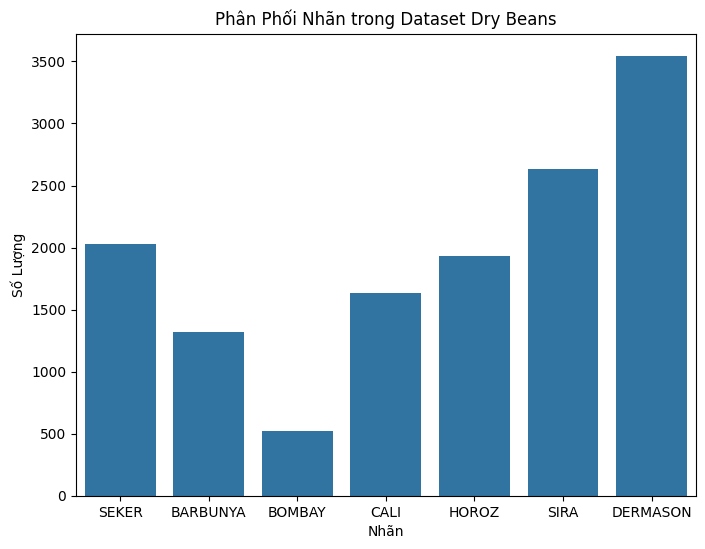

In [11]:
# Tạo biểu đồ phân phối nhãn
plt.figure(figsize=(8, 6))

# Biểu đồ cột
sns.countplot(x='Class', data=data)

# Điều chỉnh định dạng và tiêu đề
plt.title('Phân Phối Nhãn trong Dataset Dry Beans')
plt.xlabel('Nhãn')
plt.ylabel('Số Lượng')

# Hiển thị biểu đồ
plt.show()

# **Xây Dựng Mô Hình**

**KNN**

In [12]:
# Chia features và target variable
X = data.drop('Class', axis=1)
y = data['Class']

# Chuyển đổi nhãn lớp thành số nguyên bằng LabelEncoder
le = LabelEncoder()
y = le.fit_transform(y)

# Chuẩn hóa dữ liệu
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Chia dữ liệu thành tập huấn luyện và tập kiểm tra
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


# Tìm giá trị K tối ưu
best_score = 0
best_k = 0

for k in range(1, 21):
    knn = KNeighborsClassifier(n_neighbors=k)
    scores = cross_val_score(knn, X_train, y_train, cv=10)
    mean_score = scores.mean()

    if mean_score > best_score:
        best_score = mean_score
        best_k = k

print(f"K tốt nhất là {best_k} với độ chính xác trên tập validation là {best_score:.2f}")

# Huấn luyện mô hình với K tốt nhất trên toàn bộ tập huấn luyện
best_knn = KNeighborsClassifier(n_neighbors=best_k)
best_knn.fit(X_train, y_train)

# Khởi tạo và huấn luyện mô hình KNN với số láng giềng
knn = KNeighborsClassifier(n_neighbors=best_k)
knn.fit(X_train, y_train)

# Dự đoán trên tập kiểm tra
y_pred = knn.predict(X_test)

# Đánh giá mô hình
accuracy = accuracy_score(y_test, y_pred)
print(f'Độ chính xác của mô hình: {accuracy:.2f}')

# In ra báo cáo đánh giá chi tiết
print(classification_report(y_test, y_pred))

K tốt nhất là 10 với độ chính xác trên tập validation là 0.92
Độ chính xác của mô hình: 0.93
              precision    recall  f1-score   support

           0       0.94      0.90      0.92       261
           1       1.00      1.00      1.00       117
           2       0.92      0.95      0.93       317
           3       0.90      0.92      0.91       671
           4       0.98      0.95      0.96       408
           5       0.97      0.95      0.96       413
           6       0.87      0.88      0.87       536

    accuracy                           0.93      2723
   macro avg       0.94      0.94      0.94      2723
weighted avg       0.93      0.93      0.93      2723



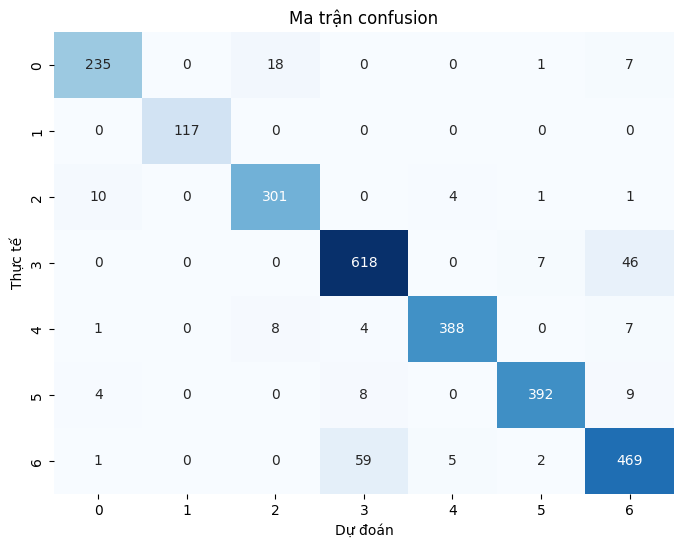

In [13]:
conf_mat = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Ma trận confusion')
plt.xlabel('Dự đoán')
plt.ylabel('Thực tế')
plt.show()

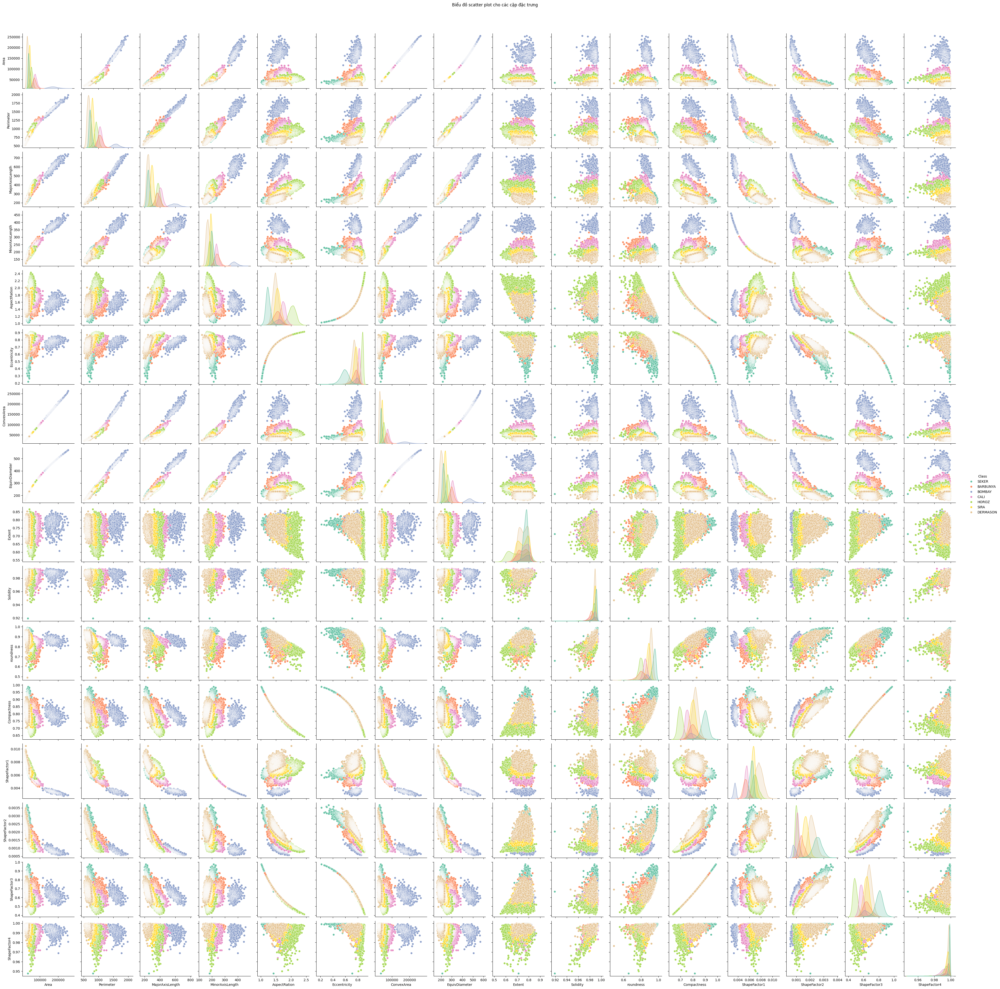

In [14]:
sns.pairplot(data, hue='Class', palette='Set2')
plt.suptitle('Biểu đồ scatter plot cho các cặp đặc trưng', y=1.02)
plt.show()

In [15]:
# Sử dụng mô hình KNN với số láng giềng (k) tốt nhất để thực hiện xác thực chéo
final_knn = KNeighborsClassifier(n_neighbors=best_k)

# Xác thực chéo với 10 fold
cv_scores = cross_val_score(final_knn, X, y, cv=10)

# In ra kết quả xác thực chéo
print("Kết quả xác thực chéo:")
print(cv_scores)
print("Độ chính xác trung bình:", np.mean(cv_scores))

Kết quả xác thực chéo:
[0.69309838 0.85966201 0.93754592 0.97575312 0.97722263 0.97501837
 0.96987509 0.94562821 0.89125643 0.6862601 ]
Độ chính xác trung bình: 0.8911320280393294


In [16]:
# cv_scores_train = cross_val_score(final_knn, X_train, y_train, cv=10)
# print("Kết quả xác thực chéo trên tập huấn luyện:")
# print(cv_scores_train)
# print("Độ chính xác trung bình trên tập huấn luyện:", np.mean(cv_scores_train))


In [17]:

# # Chọn dòng cụ thể trong dataset_test
# row_index = 182
# new_data_point = X[row_index].reshape(1, -1)

# # Dự đoán loại đậu của dòng dữ liệu cụ thể
# predicted_class = knn.predict(new_data_point)
# predicted_class_label = le.inverse_transform(predicted_class)[0]  # Chuyển ngược từ số về nhãn

# print(f"Dòng dữ liệu thứ {row_index + 2} trong dataset được dự đoán thuộc loại đậu: {predicted_class_label}")

In [18]:
class_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
print("Mã số - Loại đậu tương ứng:")
for label, code in class_mapping.items():
    print(f"{code} - {label}")

Mã số - Loại đậu tương ứng:
0 - BARBUNYA
1 - BOMBAY
2 - CALI
3 - DERMASON
4 - HOROZ
5 - SEKER
6 - SIRA


RFC(RANDOMFOREST)

In [19]:
# Chia dataset thành tập huấn luyện và tập kiểm tra
X_train, X_test, y_train, y_test = train_test_split(data.drop('Class', axis=1), data['Class'], test_size=0.2, random_state=42)

In [20]:
# Sử dụng LabelEncoder để chuyển đổi biến phụ thuộc thành dạng số
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)

In [21]:

# Xây dựng mô hình Random Forest
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train_encoded)

RandomForestClassifier(random_state=42)

In [22]:
# Dự đoán trên tập kiểm tra
y_pred_encoded = rf_model.predict(X_test)

In [23]:
# Confusion matrix
conf_matrix = confusion_matrix(y_test_encoded, y_pred_encoded)

In [24]:
# Tính tổng số lượng mẫu dự đoán sai cho mỗi nhãn
error_counts = {}
for i in range(len(label_encoder.classes_)):
    for j in range(len(label_encoder.classes_)):
        if i != j and conf_matrix[i, j] > 0:
            label_i = label_encoder.classes_[i]
            label_j = label_encoder.classes_[j]
            error_count = conf_matrix[i, j]
            # Gộp tổng số lượng mẫu dự đoán sai cho mỗi nhãn
            if label_i in error_counts:
                error_counts[label_i] += error_count
            else:
                error_counts[label_i] = error_count

Số lượng mẫu dự đoán sai cho nhãn 'BARBUNYA' là 24
Số lượng mẫu dự đoán sai cho nhãn 'CALI' là 19
Số lượng mẫu dự đoán sai cho nhãn 'DERMASON' là 52
Số lượng mẫu dự đoán sai cho nhãn 'HOROZ' là 19
Số lượng mẫu dự đoán sai cho nhãn 'SEKER' là 25
Số lượng mẫu dự đoán sai cho nhãn 'SIRA' là 62

Nhãn có số lượng mẫu dự đoán sai nhiều nhất là 'SIRA' với số lượng sai là 62


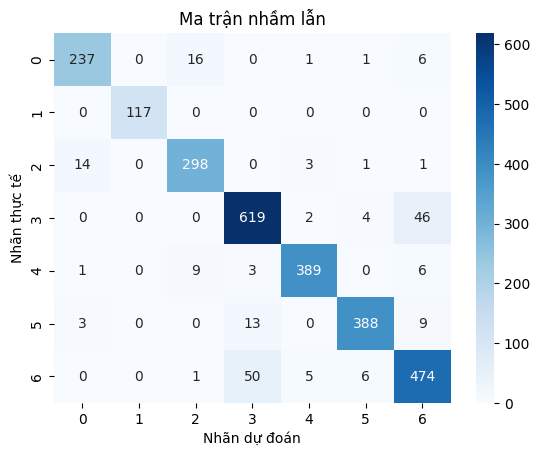

In [25]:
# Hiển thị tổng số lượng mẫu dự đoán sai cho mỗi nhãn
for label, error_count in error_counts.items():
    print(f"Số lượng mẫu dự đoán sai cho nhãn '{label}' là {error_count}")
# Hiển thị nhãn có số lượng mẫu dự đoán sai nhiều nhất
max_error_label = max(error_counts, key=error_counts.get)
print(f"\nNhãn có số lượng mẫu dự đoán sai nhiều nhất là '{max_error_label}' với số lượng sai là {error_counts[max_error_label]}")
# Tạo biểu đồ ma trận nhầm lẫn
ax = sns.heatmap(conf_matrix, cmap='Blues', annot=True, fmt='d')
ax.set_xlabel('Nhãn dự đoán')
ax.set_ylabel('Nhãn thực tế')
ax.set_title('Ma trận nhầm lẫn')

plt.show()

In [26]:
# Đánh giá mô hình
accuracy = accuracy_score(y_test_encoded, y_pred_encoded)
print(f'Accuracy: {accuracy:.2f}')

# Hiển thị báo cáo phân loại
print(classification_report(y_test_encoded, y_pred_encoded))

Accuracy: 0.93
              precision    recall  f1-score   support

           0       0.93      0.91      0.92       261
           1       1.00      1.00      1.00       117
           2       0.92      0.94      0.93       317
           3       0.90      0.92      0.91       671
           4       0.97      0.95      0.96       408
           5       0.97      0.94      0.95       413
           6       0.87      0.88      0.88       536

    accuracy                           0.93      2723
   macro avg       0.94      0.94      0.94      2723
weighted avg       0.93      0.93      0.93      2723



In [27]:
# Hiển thị một số mẫu và nhãn thực tế cùng với nhãn dự đoán
for i in range(10):
    print(f"Sample {i + 1}: Thực tế - {label_encoder.classes_[y_test_encoded[i]]}, Dự đoán - {label_encoder.classes_[y_pred_encoded[i]]}")

Sample 1: Thực tế - SEKER, Dự đoán - SEKER
Sample 2: Thực tế - BARBUNYA, Dự đoán - BARBUNYA
Sample 3: Thực tế - SEKER, Dự đoán - SEKER
Sample 4: Thực tế - SEKER, Dự đoán - SEKER
Sample 5: Thực tế - DERMASON, Dự đoán - DERMASON
Sample 6: Thực tế - SEKER, Dự đoán - SEKER
Sample 7: Thực tế - CALI, Dự đoán - CALI
Sample 8: Thực tế - SEKER, Dự đoán - SEKER
Sample 9: Thực tế - BOMBAY, Dự đoán - BOMBAY
Sample 10: Thực tế - DERMASON, Dự đoán - DERMASON


In [28]:
# Chia features và labels
X = data.drop('Class', axis=1)
y = data['Class']

# Sử dụng LabelEncoder để chuyển đổi biến phụ thuộc thành dạng số
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Xây dựng mô hình Random Forest
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

# Thực hiện xác thực chéo với 10 fold
cv_scores = cross_val_score(rf_model, X, y_encoded, cv=10)

# Hiển thị độ chính xác từ mỗi fold
for i, score in enumerate(cv_scores, 1):
    print(f"Fold {i}: Độ chính xác = {score:.2f}")

# Độ chính xác trung bình từ xác thực chéo
average_accuracy = cv_scores.mean()
print(f"\nĐộ chính xác trung bình từ xác thực chéo: {average_accuracy:.2f}")

Fold 1: Độ chính xác = 0.46
Fold 2: Độ chính xác = 0.71
Fold 3: Độ chính xác = 0.78
Fold 4: Độ chính xác = 0.94
Fold 5: Độ chính xác = 0.97
Fold 6: Độ chính xác = 0.95
Fold 7: Độ chính xác = 0.72
Fold 8: Độ chính xác = 0.71
Fold 9: Độ chính xác = 0.69
Fold 10: Độ chính xác = 0.35

Độ chính xác trung bình từ xác thực chéo: 0.73


**Decision Tree**

In [29]:
X = data.drop('Class', axis=1)  # Đặc trưng
y = data['Class']  # Nhãn

# Chia dữ liệu thành tập huấn luyện và tập kiểm tra

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [30]:

dt_classifier = DecisionTreeClassifier()
dt_classifier.fit(X_train, y_train)
# Dự đoán nhãn trên tập kiểm tra
y_pred = dt_classifier.predict(X_test)
# Đánh giá mô hình
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)
print(f'chính xác: {accuracy}')
print('Classification Report:\n', report)

chính xác: 0.8916636063165626
Classification Report:
               precision    recall  f1-score   support

    BARBUNYA       0.87      0.86      0.87       261
      BOMBAY       1.00      1.00      1.00       117
        CALI       0.88      0.91      0.89       317
    DERMASON       0.88      0.89      0.88       671
       HOROZ       0.94      0.92      0.93       408
       SEKER       0.94      0.91      0.93       413
        SIRA       0.83      0.84      0.84       536

    accuracy                           0.89      2723
   macro avg       0.91      0.90      0.91      2723
weighted avg       0.89      0.89      0.89      2723



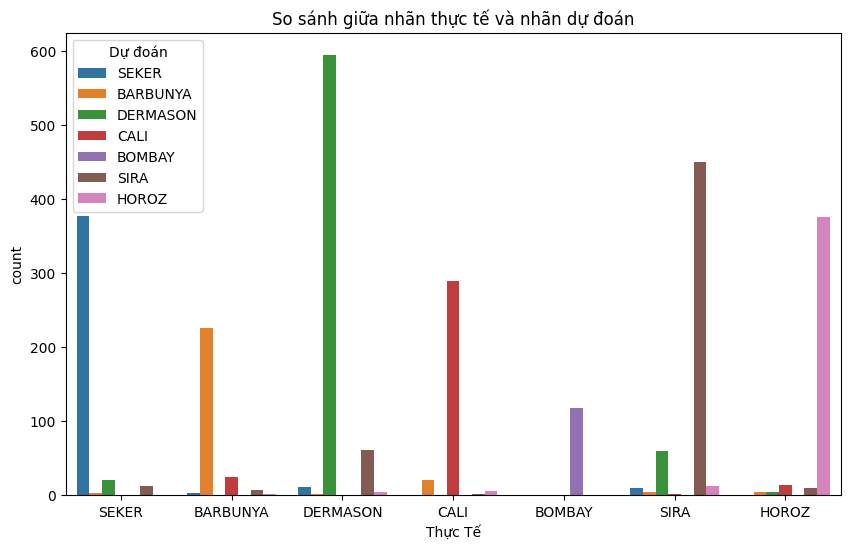

In [31]:
# Tạo DataFrame với nhãn thực tế và dự đoán
result_df = pd.DataFrame({'Thực Tế': y_test, 'Dự đoán': y_pred})
# Vẽ biểu đồ so sánh giữa nhãn thực tế và nhãn dự đoán
plt.figure(figsize=(10, 6))
sns.countplot(x='Thực Tế', hue='Dự đoán', data=result_df)
plt.title('So sánh giữa nhãn thực tế và nhãn dự đoán')
plt.show()

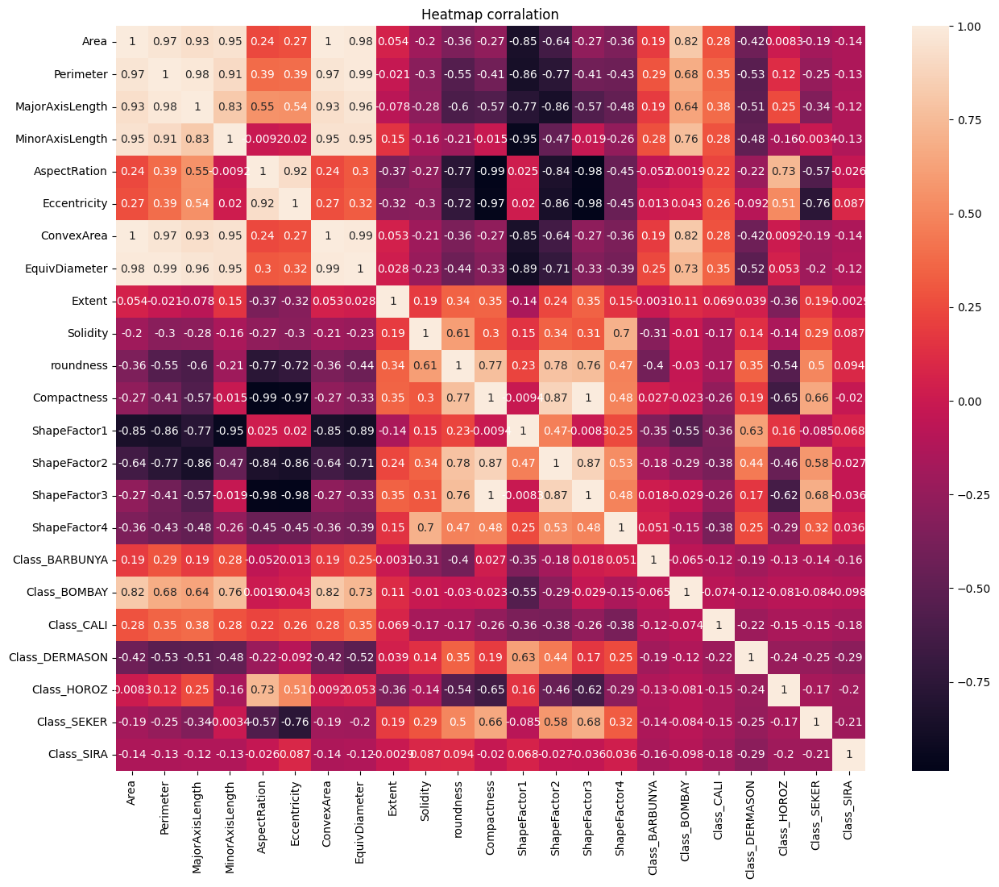

In [32]:

plt.figure(figsize=(15,12))
plt.title('Heatmap corralation')
sns.heatmap(data=pd.get_dummies(data).corr(), annot=True);

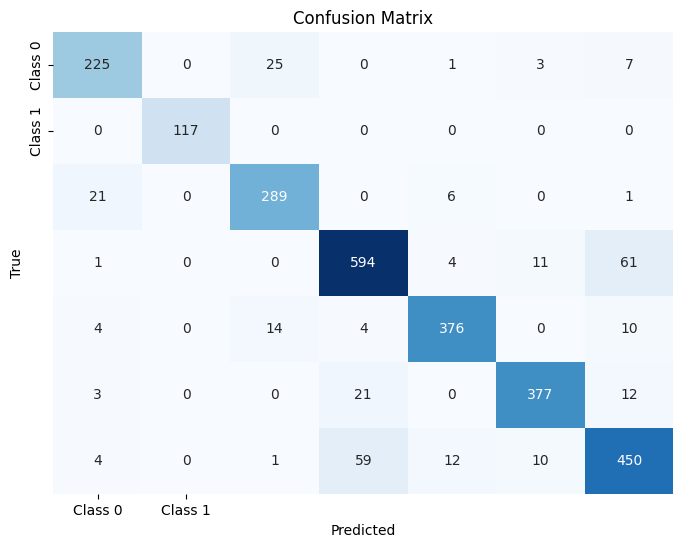

In [33]:
# Create a confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Display the confusion matrix using a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False,
            xticklabels=['Class 0', 'Class 1'], yticklabels=['Class 0', 'Class 1'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

sns.heatmap(...): Tạo biểu đồ heatmap sử dụng thư viện Seaborn để hiển thị ma trận nhầm lẫn. annot=True làm cho các giá trị của ô được hiển thị trên biểu đồ, và fmt="d" là định dạng số nguyên. cmap="Blues" là màu sắc được sử dụng cho heatmap.

xticklabels và yticklabels: Cung cấp nhãn cho trục x và trục y trên biểu đồ heatmap để xác định lớp tương ứng với mỗi chiều.

plt.xlabel('Predicted') và plt.ylabel('True'): Đặt nhãn cho trục x và trục y trên biểu đồ heatmap.

Decision Tree Accuracy: 0.8916636063165626


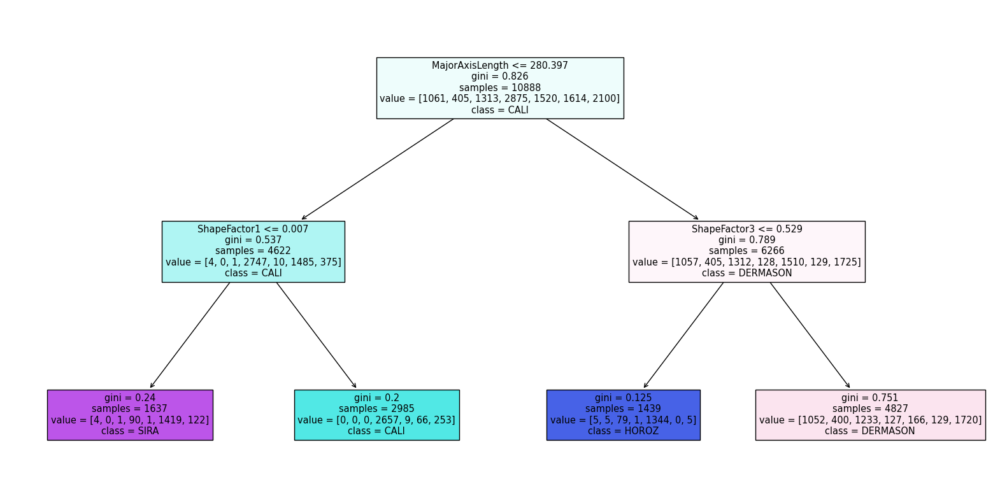

In [34]:
# Initialize the Decision Tree classifier
#dt_classifier = DecisionTreeClassifier(random_state=42)


# Tạo mô hình với giới hạn chiều sâu
dt_classifier_pruned = DecisionTreeClassifier(max_depth=2)
# Huấn luyện mô hình
dt_classifier_pruned.fit(X_train, y_train)

# Evaluate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Decision Tree Accuracy: {accuracy}")
# Visualize the Decision Tree
# Vẽ cây quyết định
plt.figure(figsize=(20, 10))
plot_tree(dt_classifier_pruned, feature_names=X.columns, class_names=data['Class'].unique(), filled=True)
plt.show()

In [35]:
feature_importances = dt_classifier_pruned.feature_importances_

# Hiển thị độ quan trọng của từng đặc trưng
for feature, importance in zip(X.columns, feature_importances):
    print(f'{feature}: {importance}')


Area: 0.0
Perimeter: 0.0
MajorAxisLength: 0.3738650422351787
MinorAxisLength: 0.0
AspectRation: 0.0
Eccentricity: 0.0
ConvexArea: 0.0
EquivDiameter: 0.0
Extent: 0.0
Solidity: 0.0
roundness: 0.0
Compactness: 0.0
ShapeFactor1: 0.35503161711654957
ShapeFactor2: 0.0
ShapeFactor3: 0.2711033406482718
ShapeFactor4: 0.0


feature_importances là một mảng chứa giá trị độ quan trọng của từng đặc trưng trong mô hình cây quyết định. Các giá trị này được tính toán bằng mô hình sau quá trình huấn luyện và phản ánh mức độ ảnh hưởng của mỗi đặc trưng đối với quyết định của mô hình.
X.columns là danh sách các tên đặc trưng của dữ liệu đầu vào. Đối với mỗi đặc trưng, một giá trị quan trọng tương ứng được tính toán.
trong vòng lặp for, feature là tên của từng đặc trưng và importance là giá trị độ quan trọng của đặc trưng đó.

In [36]:

max_depth_values = range(3, 20)
best_max_depth = None
best_score = 0.0
for max_depth in max_depth_values:
    clf = DecisionTreeClassifier(max_depth=max_depth, random_state=42)
    clf.fit(X_train, y_train)
    test_score = clf.score(X_test, y_test)

    print(f"Max Depth = {max_depth}: Test Score = {test_score}")
    if test_score > best_score:
        best_score = test_score
        best_max_depth = max_depth

# Print the best max depth and corresponding score
print(f"Best Max Depth = {best_max_depth}: Best Test Score = {best_score}")

Max Depth = 3: Test Score = 0.7631289019463827
Max Depth = 4: Test Score = 0.8226221079691517
Max Depth = 5: Test Score = 0.8758721997796548
Max Depth = 6: Test Score = 0.8997429305912596
Max Depth = 7: Test Score = 0.906720528828498
Max Depth = 8: Test Score = 0.9045170767535806
Max Depth = 9: Test Score = 0.9056188027910393
Max Depth = 10: Test Score = 0.9056188027910393
Max Depth = 11: Test Score = 0.9037825927286082
Max Depth = 12: Test Score = 0.9023136246786633
Max Depth = 13: Test Score = 0.8990084465662872
Max Depth = 14: Test Score = 0.8949687844289387
Max Depth = 15: Test Score = 0.8957032684539111
Max Depth = 16: Test Score = 0.8964377524788836
Max Depth = 17: Test Score = 0.8975394785163423
Max Depth = 18: Test Score = 0.89386705839148
Max Depth = 19: Test Score = 0.8942343004039662
Best Max Depth = 7: Best Test Score = 0.906720528828498


In [37]:

# Perform 10-fold cross-validation
scores = cross_val_score(clf, X, y, cv=10)
# Print the cross-validation scores
print("Cross-Validation Scores:", scores)
print("Mean CV Score:", scores.mean())

Cross-Validation Scores: [0.47723935 0.73548861 0.75385746 0.80749449 0.93534166 0.78398237
 0.71785452 0.71197649 0.67083027 0.32696547]
Mean CV Score: 0.6921030683795818


clf: Là mô hình máy học đã được huấn luyện trước đó (DecisionTreeClassifier trong trường hợp này).

X: Là ma trận đặc trưng của dữ liệu.

y: Là vector nhãn của dữ liệu.

In [38]:

# Export the text representation of the decision tree
tree_rules = export_text(clf, feature_names=X.columns.tolist())
print(tree_rules)

|--- MajorAxisLength <= 280.40
|   |--- ShapeFactor1 <= 0.01
|   |   |--- ShapeFactor3 <= 0.73
|   |   |   |--- roundness <= 0.93
|   |   |   |   |--- ShapeFactor3 <= 0.72
|   |   |   |   |   |--- Solidity <= 0.99
|   |   |   |   |   |   |--- ShapeFactor1 <= 0.01
|   |   |   |   |   |   |   |--- roundness <= 0.81
|   |   |   |   |   |   |   |   |--- class: SEKER
|   |   |   |   |   |   |   |--- roundness >  0.81
|   |   |   |   |   |   |   |   |--- ShapeFactor4 <= 1.00
|   |   |   |   |   |   |   |   |   |--- Extent <= 0.82
|   |   |   |   |   |   |   |   |   |   |--- ShapeFactor4 <= 1.00
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 5
|   |   |   |   |   |   |   |   |   |   |--- ShapeFactor4 >  1.00
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 4
|   |   |   |   |   |   |   |   |   |--- Extent >  0.82
|   |   |   |   |   |   |   |   |   |   |--- class: DERMASON
|   |   |   |   |   |   |   |   |--- ShapeFactor4 >  1.00
|   |   |

export_text(clf, feature_names=X.columns.tolist()): Hàm này tạo ra biểu diễn văn bản của cây quyết định. Tham số clf là mô hình cây quyết định đã được huấn luyện, và feature_names=X.columns.tolist() chỉ định tên của các đặc trưng để biểu diễn chúng trong quy tắc quyết định.